# Small Object Detection using Street Signs dataset.


1. Installing dependencies

In [ ]:
!pip install ultralytics opencv-python numpy torch torchvision torchaudio tqdm pillow
!pip install labelImg

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 949.3/949.3 kB 15.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 51.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 33.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 35.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 11.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 81.2 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstall

In [ ]:
from ultralytics import YOLO
model = YOLO("yolov8n.pt")

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


100%|██████████| 6.25M/6.25M [00:00<00:00, 17.3MB/s]


2. Unzipping the folder contents

In [ ]:
!unzip -q /content/RoadSign.zip -d /content

3. Training the model

In [ ]:
# Train YOLOv8 with 1240 img size
model.train(
    data="/content/RoadSignal/data.yaml",
    imgsz=1240,          # Image size
    epochs=50,           # Number of epochs
    batch=16,            # Adjust based on available VRAM
    workers=2,           # Reduce workers if Colab crashes
    device="cuda"        # Use GPU if available
)

print("Training completed!")

Ultralytics 8.3.91 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/RoadSignal/data.yaml, epochs=50, time=None, patience=100, batch=16, imgsz=1240, save=True, save_period=-1, cache=False, device=cuda, workers=2, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_b

100%|██████████| 755k/755k [00:00<00:00, 19.7MB/s]


Overriding model.yaml nc=80 with nc=23

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytic

100%|██████████| 5.35M/5.35M [00:00<00:00, 91.0MB/s]


AMP: checks passed ✅
WARNING ⚠️ imgsz=[1240] must be multiple of max stride 32, updating to [1248]


train: Scanning /content/RoadSignal/train/labels... 2673 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2673/2673 [00:01<00:00, 2353.53it/s]

train: New cache created: /content/RoadSignal/train/labels.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/RoadSignal/valid/labels... 169 images, 0 backgrounds, 0 corrupt: 100%|██████████| 169/169 [00:00<00:00, 1202.33it/s]

val: New cache created: /content/RoadSignal/valid/labels.cache


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.00037, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 1248 train, 1248 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      7.69G      1.439       6.66      1.589          0       1248: 100%|██████████| 168/168 [02:46<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:06<00:00,  1.05s/it]

                   all        169        205      0.254      0.291      0.211      0.129



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      9.42G      1.336      5.231      1.469          4       1248: 100%|██████████| 168/168 [02:42<00:00,  1.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.37it/s]


                   all        169        205      0.215      0.473      0.293      0.175

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      9.44G      1.344      4.577      1.493          1       1248: 100%|██████████| 168/168 [02:44<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.29it/s]

                   all        169        205      0.324      0.543      0.379      0.252



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      9.45G       1.28       3.78      1.451          1       1248: 100%|██████████| 168/168 [02:43<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.27it/s]

                   all        169        205      0.385      0.488      0.442      0.279



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      9.47G      1.283      3.249      1.413          1       1248: 100%|██████████| 168/168 [02:43<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.29it/s]

                   all        169        205      0.421      0.579      0.514      0.329



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      9.49G      1.221       2.78      1.383          2       1248: 100%|██████████| 168/168 [02:43<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:05<00:00,  1.15it/s]


                   all        169        205      0.565      0.531      0.566      0.371

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50       9.5G      1.199      2.428      1.361          2       1248: 100%|██████████| 168/168 [02:44<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.65it/s]

                   all        169        205      0.519      0.565      0.618      0.424



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      9.52G      1.182      2.205      1.361          2       1248: 100%|██████████| 168/168 [02:44<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.78it/s]

                   all        169        205      0.557      0.642      0.672      0.465



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      9.54G       1.18      2.012      1.348          2       1248: 100%|██████████| 168/168 [02:42<00:00,  1.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.26it/s]

                   all        169        205       0.56      0.736      0.729      0.477



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      9.55G      1.154      1.831      1.323          2       1248: 100%|██████████| 168/168 [02:39<00:00,  1.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.64it/s]

                   all        169        205      0.591      0.751      0.759      0.483



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      9.57G       1.14      1.701      1.314          4       1248: 100%|██████████| 168/168 [02:40<00:00,  1.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.37it/s]

                   all        169        205      0.663      0.772      0.805      0.538



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      9.59G      1.106       1.57      1.294          2       1248: 100%|██████████| 168/168 [02:39<00:00,  1.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.49it/s]


                   all        169        205      0.742      0.749      0.836      0.575

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      9.61G      1.113      1.492      1.302          1       1248: 100%|██████████| 168/168 [02:44<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.64it/s]

                   all        169        205      0.714      0.709      0.798      0.531



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      9.62G      1.074      1.423      1.266          2       1248: 100%|██████████| 168/168 [02:44<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.43it/s]

                   all        169        205      0.681      0.748      0.811      0.563



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      9.64G      1.075      1.389      1.268          5       1248: 100%|██████████| 168/168 [02:39<00:00,  1.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.26it/s]

                   all        169        205      0.729       0.81      0.836      0.571



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      9.66G       1.06      1.319       1.25          0       1248: 100%|██████████| 168/168 [02:41<00:00,  1.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.84it/s]


                   all        169        205      0.761      0.799      0.846      0.558

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      9.67G      1.048      1.211      1.253          1       1248: 100%|██████████| 168/168 [02:41<00:00,  1.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.65it/s]

                   all        169        205      0.777      0.754      0.825      0.586



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      9.69G      1.041      1.187      1.245          1       1248: 100%|██████████| 168/168 [02:42<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.89it/s]


                   all        169        205      0.772      0.816      0.864      0.574

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      9.71G      1.025      1.142      1.236          2       1248: 100%|██████████| 168/168 [02:40<00:00,  1.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:06<00:00,  1.05s/it]

                   all        169        205      0.774      0.774      0.861        0.6



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      9.72G      1.002      1.127      1.221          1       1248: 100%|██████████| 168/168 [02:41<00:00,  1.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.28it/s]

                   all        169        205      0.773      0.788      0.869       0.59



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      9.74G     0.9918      1.066      1.214          3       1248: 100%|██████████| 168/168 [02:39<00:00,  1.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:05<00:00,  1.14it/s]

                   all        169        205      0.733      0.803       0.85      0.584



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      9.76G     0.9814      1.036      1.212          1       1248: 100%|██████████| 168/168 [02:43<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:05<00:00,  1.18it/s]

                   all        169        205      0.781      0.823      0.865      0.589



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      9.78G     0.9753      1.008      1.208          4       1248: 100%|██████████| 168/168 [02:42<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:07<00:00,  1.22s/it]


                   all        169        205      0.784      0.837       0.88      0.628

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      9.79G     0.9578     0.9572      1.177          2       1248: 100%|██████████| 168/168 [02:44<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:05<00:00,  1.05it/s]

                   all        169        205      0.787       0.79      0.876      0.607



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      9.81G     0.9427      0.964      1.192          2       1248: 100%|██████████| 168/168 [02:44<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:05<00:00,  1.07it/s]

                   all        169        205      0.839       0.79      0.877      0.613



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      9.83G     0.9396     0.9233      1.183          2       1248: 100%|██████████| 168/168 [02:47<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.43it/s]

                   all        169        205      0.828      0.749      0.864      0.608



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      9.85G     0.9265     0.8973      1.177          1       1248: 100%|██████████| 168/168 [02:46<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.65it/s]

                   all        169        205      0.821       0.76      0.883      0.618



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      9.86G     0.9143     0.8802      1.165          3       1248: 100%|██████████| 168/168 [02:47<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:06<00:00,  1.03s/it]

                   all        169        205      0.819      0.831      0.892      0.617



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      9.88G     0.9012     0.8492      1.147          0       1248: 100%|██████████| 168/168 [02:45<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:06<00:00,  1.03s/it]

                   all        169        205      0.836      0.754      0.887      0.609



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50       9.9G     0.8861      0.832      1.144          0       1248: 100%|██████████| 168/168 [02:43<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.72it/s]

                   all        169        205      0.842      0.795      0.878       0.62



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      9.91G     0.8914     0.8116      1.157          3       1248: 100%|██████████| 168/168 [02:43<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.67it/s]

                   all        169        205      0.839      0.771      0.887      0.618



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      9.93G     0.8721     0.7955      1.134          1       1248: 100%|██████████| 168/168 [02:43<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.47it/s]

                   all        169        205      0.779      0.833      0.885      0.621



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      9.95G     0.8609     0.7713      1.135          1       1248: 100%|██████████| 168/168 [02:47<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:06<00:00,  1.01s/it]

                   all        169        205      0.837      0.819      0.892      0.631



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      9.97G     0.8534     0.7565      1.124          3       1248: 100%|██████████| 168/168 [02:40<00:00,  1.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:05<00:00,  1.11it/s]

                   all        169        205      0.825      0.836      0.897      0.621



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      9.98G     0.8418     0.7406      1.119          2       1248: 100%|██████████| 168/168 [02:38<00:00,  1.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.50it/s]

                   all        169        205      0.797      0.871      0.902      0.632



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50        10G     0.8223     0.7267      1.113          2       1248: 100%|██████████| 168/168 [02:40<00:00,  1.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.41it/s]

                   all        169        205       0.81       0.82      0.887      0.613



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50        10G     0.8237     0.7162      1.113          3       1248: 100%|██████████| 168/168 [02:43<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.68it/s]

                   all        169        205      0.758      0.867      0.879      0.612



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50        10G     0.8136     0.7074      1.105          3       1248: 100%|██████████| 168/168 [02:45<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.40it/s]

                   all        169        205      0.809       0.86      0.895      0.626



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      10.1G     0.8062     0.6949      1.096          2       1248: 100%|██████████| 168/168 [02:45<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.84it/s]

                   all        169        205      0.801      0.834      0.892       0.62



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      10.1G     0.8111     0.6923      1.106          1       1248: 100%|██████████| 168/168 [02:44<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.63it/s]

                   all        169        205      0.781      0.849      0.893      0.627


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      10.1G     0.8076     0.6286      1.094          1       1248: 100%|██████████| 168/168 [02:33<00:00,  1.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.78it/s]


                   all        169        205      0.827      0.814      0.881      0.619

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      10.1G     0.7871      0.601       1.07          1       1248: 100%|██████████| 168/168 [02:27<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.74it/s]

                   all        169        205      0.787      0.836       0.88      0.609



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      10.1G     0.7675     0.5888      1.065          2       1248: 100%|██████████| 168/168 [02:26<00:00,  1.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.87it/s]


                   all        169        205      0.824       0.82      0.898      0.631

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      10.1G     0.7612     0.5753      1.053          1       1248: 100%|██████████| 168/168 [02:26<00:00,  1.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.82it/s]


                   all        169        205      0.859      0.801      0.897      0.637

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      10.2G     0.7472     0.5624      1.039          1       1248: 100%|██████████| 168/168 [02:26<00:00,  1.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.82it/s]

                   all        169        205      0.875       0.79      0.906       0.63



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      10.2G     0.7307     0.5525      1.047          2       1248: 100%|██████████| 168/168 [02:27<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.70it/s]


                   all        169        205      0.884      0.795       0.91      0.642

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      10.2G      0.721     0.5321      1.037          1       1248: 100%|██████████| 168/168 [02:26<00:00,  1.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.76it/s]

                   all        169        205      0.861       0.81      0.909      0.635



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      10.2G     0.7174     0.5502      1.029          1       1248: 100%|██████████| 168/168 [02:31<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.50it/s]

                   all        169        205      0.867      0.801      0.911      0.641



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      10.2G     0.7276     0.5474      1.033          1       1248: 100%|██████████| 168/168 [02:32<00:00,  1.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.93it/s]


                   all        169        205      0.865      0.803       0.91      0.636

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      10.2G      0.691     0.5168      1.007          1       1248: 100%|██████████| 168/168 [02:29<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.74it/s]

                   all        169        205      0.871      0.811      0.912      0.639



50 epochs completed in 2.306 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 6.3MB
Optimizer stripped from runs/detect/train/weights/best.pt, 6.3MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.91 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,010,133 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:12<00:00,  2.03s/it]


                   all        169        205      0.886      0.795       0.91      0.641
          do_not_enter          9         11          1      0.684      0.995      0.674
         do_not_turn_l         10         11       0.85      0.818      0.956      0.719
         do_not_turn_r          6          7      0.753      0.714      0.765      0.658
         do_not_u_turn          9         10          1      0.742      0.932      0.773
              give_way          9         10      0.973        0.8      0.892      0.514
                  hump          8          8          1      0.849      0.995      0.625
           narrow_road          7          7      0.967      0.857      0.978      0.344
           no_stopping         10         10      0.968          1      0.995       0.82
   pedestrian_crossing          7          7       0.92      0.571      0.842      0.513
             red_light          9         12      0.852          1      0.901      0.614
        speed_limit_1

4. Running validation on the model

In [ ]:
# Run validation on test dataset
metrics = model.val(data="/content/RoadSignal/data.yaml", imgsz=1240)

# Print results
print(" Validation Complete! Results:")
print(metrics)

WARNING ⚠️ imgsz=[1240] must be multiple of max stride 32, updating to [1248]
Ultralytics 8.3.91 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)


val: Scanning /content/RoadSignal/valid/labels.cache... 169 images, 0 backgrounds, 0 corrupt: 100%|██████████| 169/169 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:10<00:00,  1.03it/s]


                   all        169        205      0.883      0.793      0.909      0.642
          do_not_enter          9         11          1        0.7      0.995      0.696
         do_not_turn_l         10         11      0.851      0.818      0.956      0.733
         do_not_turn_r          6          7      0.754      0.714      0.754      0.649
         do_not_u_turn          9         10          1      0.734      0.941      0.766
              give_way          9         10      0.973        0.8      0.929      0.519
                  hump          8          8          1      0.851      0.995      0.625
           narrow_road          7          7      0.967      0.857      0.978      0.353
           no_stopping         10         10      0.965          1      0.995      0.844
   pedestrian_crossing          7          7       0.92      0.571      0.842      0.505
             red_light          9         12      0.852          1      0.909      0.628
        speed_limit_1

5. Testing the model on the test data.

In [ ]:
import glob
import numpy as np
import cv2
from ultralytics import YOLO

# Load trained YOLOv8 model
best_model = YOLO("/content/detect/detect/train/weights/best.pt")  # Update with your best weights

# Path to test images
test_images_path = "/content/RoadSign/test/images/*"

# Get all test images
test_images = glob.glob(test_images_path)

# Run inference on all test images
results = best_model(test_images, imgsz=640, conf=0.05, save=True)

print("\nInference completed on all test images!")
print("\nDetection Results for Each Image:")

# Loop through the results and overwrite images with drawn bounding boxes
for i, r in enumerate(results):
    image_path = test_images[i]
    image = cv2.imread(image_path)  # Read the image using OpenCV

    for box in r.boxes:
        class_id = int(box.cls)
        class_name = best_model.names[class_id]  # Get class name
        confidence = box.conf.item()  # Confidence score
        x1, y1, x2, y2 = map(int, box.xyxy[0])  # Convert bbox to integer

        # Draw bounding box
        color = (0, 255, 0)  # Green color for bounding boxes
        cv2.rectangle(image, (x1, y1), (x2, y2), color, 2)

        # Add text label
        label = f"{class_name} ({confidence:.2f})"
        cv2.putText(image, label, (x1, y1 - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)

    # Overwrite the original image with modified version
    cv2.imwrite(image_path, image)

print("\nAll test images updated with detected objects!")



0: 640x640 (no detections), 339.6ms
1: 640x640 1 do_not_enter, 339.6ms
2: 640x640 1 do_not_turn_r, 339.6ms
3: 640x640 1 do_not_u_turn, 1 speed_limit_60, 339.6ms
4: 640x640 1 hump, 1 speed_limit_20, 1 speed_limit_30, 1 speed_limit_40, 339.6ms
5: 640x640 1 give_way, 339.6ms
6: 640x640 1 do_not_turn_l, 339.6ms
7: 640x640 (no detections), 339.6ms
8: 640x640 1 speed_limit_60, 1 speed_limit_80, 1 speed_limit_90, 339.6ms
9: 640x640 1 do_not_turn_l, 339.6ms
10: 640x640 1 do_not_u_turn, 339.6ms
11: 640x640 2 stops, 339.6ms
12: 640x640 1 speed_limit_5, 339.6ms
13: 640x640 1 speed_limit_60, 1 speed_limit_90, 339.6ms
14: 640x640 1 stop, 339.6ms
15: 640x640 1 give_way, 339.6ms
16: 640x640 1 pedestrian_crossing, 1 speed_limit_90, 339.6ms
17: 640x640 1 speed_limit_60, 339.6ms
18: 640x640 1 do_not_enter, 339.6ms
19: 640x640 1 speed_limit_50, 1 speed_limit_60, 339.6ms
20: 640x640 2 speed_limit_60s, 1 speed_limit_70, 1 speed_limit_80, 1 speed_limit_90, 339.6ms
21: 640x640 1 speed_limit_40, 1 speed_limi

6. Printing all the outputs.

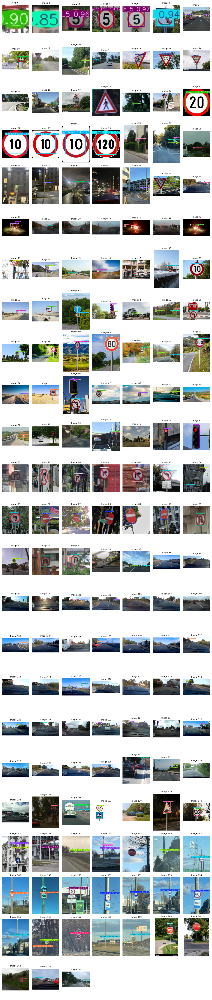

In [16]:
import os
import matplotlib.pyplot as plt
import cv2
from glob import glob
import math

# Path to YOLO output images
output_images_path = "/content/runs/detect/predict"  # Update this if needed

# Get all images from the folder
image_files = sorted(glob(os.path.join(output_images_path, "*.jpg")))  # Change to ".png" if needed

# Define grid layout: 7 images per column
num_images = len(image_files)
num_columns = 7
num_rows = math.ceil(num_images / num_columns)  # Calculate required rows

# Create subplots
fig, axes = plt.subplots(num_rows, num_columns, figsize=(15, num_rows * 3))
fig.subplots_adjust(hspace=0.1, wspace=0.1)

# Iterate through images and plot
for i, ax in enumerate(axes.flat):
    if i < num_images:
        img = cv2.imread(image_files[i])
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
        ax.imshow(img)
        ax.set_title(f"Image {i+1}", fontsize=8)
        ax.axis("off")
    else:
        ax.axis("off")  # Hide extra subplots if not enough images

plt.show()

7. Printing only the outputs for small object detection.

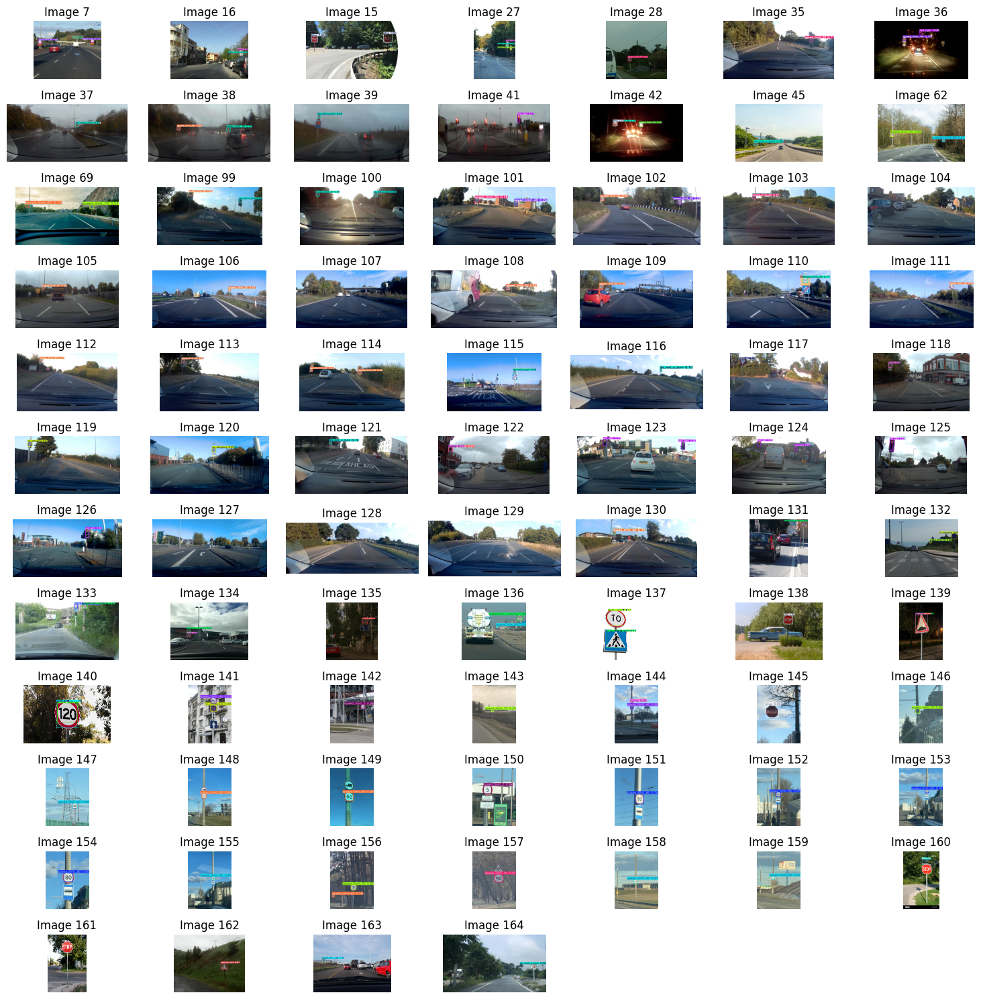

In [23]:
import os
import cv2
import glob
import matplotlib.pyplot as plt

# Path to already processed images (with bounding boxes)
output_images_path = "/content/runs/detect/predict"

# Get sorted list of images
image_files = sorted(glob.glob(os.path.join(output_images_path, "*.jpg")))

# Indices of images to highlight (7th image, 16th image, etc.)
highlight_indices = [
    7, 16, 15, 27, 28, 35, 36, 37, 38, 39, 41, 42, 45, 62, 69
] + list(range(99, 165))  # 99th to 164th images

# Ensure indices are within range
highlight_indices = [i - 1 for i in highlight_indices if 0 <= i - 1 < len(image_files)]

# Set grid size (7 columns)
cols = 7
rows = -(-len(highlight_indices) // cols)  # Compute number of rows needed
fig, axes = plt.subplots(rows, cols, figsize=(15, 15))

# Display images in a grid
for idx, img_idx in enumerate(highlight_indices):
    img_path = image_files[img_idx]  # Get the corresponding image path

    # Read image (already processed with bounding boxes)
    img = cv2.imread(img_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Display in grid
    ax = axes[idx // cols, idx % cols]
    ax.imshow(img_rgb)
    ax.set_title(f"Image {img_idx + 1}")
    ax.axis("off")

# Remove empty subplots if any
for i in range(idx + 1, rows * cols):
    fig.delaxes(axes.flatten()[i])

plt.tight_layout()
plt.show()

8. Printing metrics

In [ ]:
# display metrics on test set using its labels
metrics = best_model.val(data="/content/RoadSign/data.yaml", imgsz=1240, conf=0.05, split='test', device="cpu")

# Compute mean F1-score
mean_f1_score = np.mean(metrics.box.f1)

# Print key evaluation metrics
print("\nModel Performance on Test Set:")
print(f" mAP@50: {metrics.box.map50:.4f}")
print(f" mAP@50-95: {metrics.box.map:.4f}")
print(f" Precision: {metrics.box.mp:.4f}")
print(f" Recall: {metrics.box.mr:.4f}")
print(f" F1-Score (Approx Accuracy): {mean_f1_score:.4f}")

print("\nTest set evaluation and object detection completed!")

WARNING ⚠️ imgsz=[1240] must be multiple of max stride 32, updating to [1248]
Ultralytics 8.3.91 🚀 Python-3.11.11 torch-2.6.0+cu124 CPU (Intel Xeon 2.20GHz)


val: Scanning /content/RoadSign/test/labels.cache... 164 images, 0 backgrounds, 0 corrupt: 100%|██████████| 164/164 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [02:40<00:00, 14.57s/it]


                   all        164        218      0.811      0.623      0.743      0.496
          do_not_enter          7          7          1      0.665      0.857      0.669
         do_not_turn_l         10         11      0.957      0.818      0.892      0.595
         do_not_turn_r          6          6          1      0.814      0.893      0.778
         do_not_u_turn          7          8      0.924      0.625      0.687      0.496
              give_way          9          9      0.886      0.866      0.852      0.599
                  hump          7          7      0.615      0.571      0.695      0.316
           narrow_road          7          7      0.725      0.758      0.834      0.368
           no_stopping         10         12      0.833      0.417      0.631      0.526
   pedestrian_crossing          7          7       0.83      0.571      0.803      0.468
             red_light          9         20      0.751       0.55      0.655      0.345
        speed_limit_1

In [13]:
import shutil

# Define source and destination paths
output_folder = "/content/runs/detect/predict"  # Update this if your folder name is different
drive_backup_folder = "/content/drive/MyDrive/YOLO_output_pictures"

# Copy the entire folder to Google Drive
shutil.copytree(output_folder, drive_backup_folder, dirs_exist_ok=True)

print(f"Backup completed! The YOLO output is saved in {drive_backup_folder}")

Backup completed! The YOLO output is saved in /content/drive/MyDrive/YOLO_output_pictures


7. Saving the model to drive.

In [9]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import shutil

source_folder = "/content/runs"
destination_folder = "/content/drive/MyDrive/YOLO_Backup/"

# Copy everything inside "runs" to Google Drive
shutil.copytree(source_folder, destination_folder, dirs_exist_ok=True)

print("YOLO training files saved successfully!")

YOLO training files saved successfully!
